In [1]:
import os

import cv2

Saving zootopia2.jpeg to zootopia2.jpeg
Successfully uploaded: zootopia2.jpeg


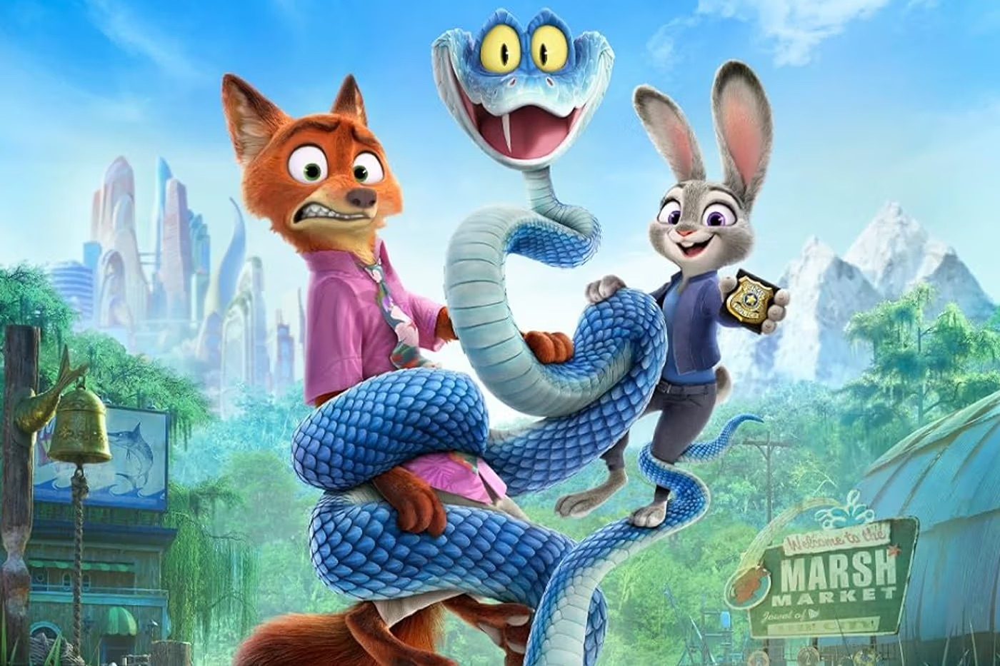

In [30]:
from google.colab import files
from PIL import Image
import io

# 1. Trigger the upload dialog
uploaded = files.upload()

# 2. Automatically find the file name (no more hardcoding 'zootopia2'!)
for filename in uploaded.keys():
    print(f'Successfully uploaded: {filename}')

    # 3. Read the image data directly from memory
    # io.BytesIO allows us to read the data without saving it to a folder first
    image_data = uploaded[filename]
    img = Image.open(io.BytesIO(image_data))

    # 4. Display the image
    display(img)

#Colorspaces

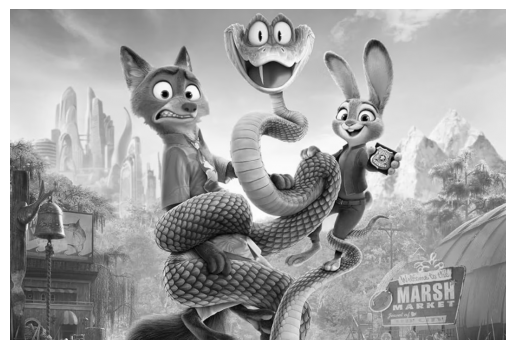

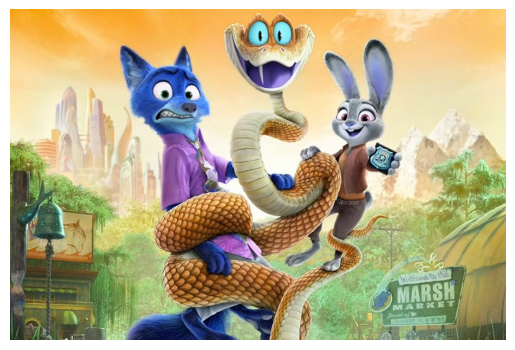

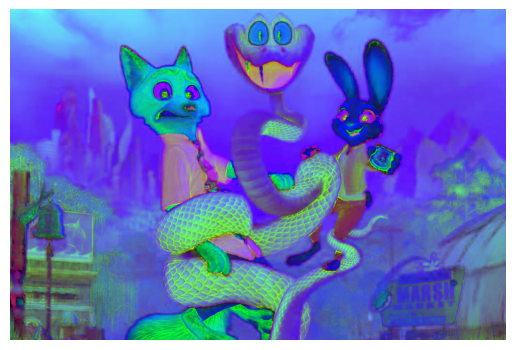

In [53]:
import numpy as np

# Convert the PIL Image object 'img' to a NumPy array
# PIL typically loads images in RGB format
img_np = np.array(img)

# Perform color conversions using the NumPy array
img_gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
img_rgb = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR) # Convert RGB (from PIL) to BGR (OpenCV's standard)
img_hsv = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV)

out_dir = "outputs"
os.makedirs(out_dir, exist_ok=True)

gray_jpg_path = os.path.join(out_dir, "gray.jpg")
rgb_jpg_path  = os.path.join(out_dir, "rgb.jpg")
hsv_jpg_path  = os.path.join(out_dir, "hsv.jpg")

cv2.imwrite(gray_jpg_path, img_gray)
cv2.imwrite(rgb_jpg_path,  img_rgb)  # img_rgb is already BGR
cv2.imwrite(hsv_jpg_path,  img_hsv)

import matplotlib.pyplot as plt

plt.imshow(img_gray, cmap="gray")
plt.axis("off")
plt.show()

plt.imshow(img_rgb)
plt.axis("off")
plt.show()

plt.imshow(img_hsv)
plt.axis("off")
plt.show()


#Blurring

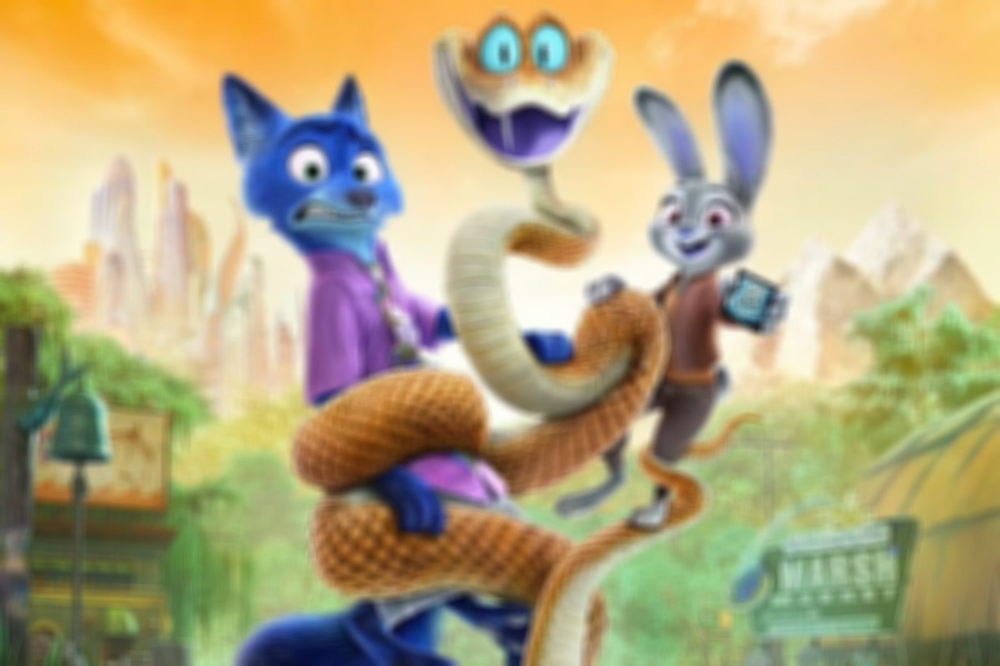

In [60]:
import numpy as np

k_size = 15

# Convert the PIL Image object 'img' to a NumPy array, as OpenCV functions expect NumPy arrays
img_np = np.array(img)

img_blur = cv2.blur(img_np, (k_size, k_size))

# Note: cv2_imshow function needs to be imported if it's not already.
# from google.colab.patches import cv2_imshow

# cv2_imshow expects an image in BGR format, if img_np is RGB, convert it
# If img_np is already loaded as RGB (from PIL), and cv2_imshow expects BGR, a conversion might be needed.
# For simple blurring, if the input is a grayscale or a 3-channel image, cv2.blur will work.
# Assuming img_np is a standard 3-channel RGB from PIL, and cv2_imshow can display it as is or handle it internally.
cv2_imshow(img_blur)

#Threshold

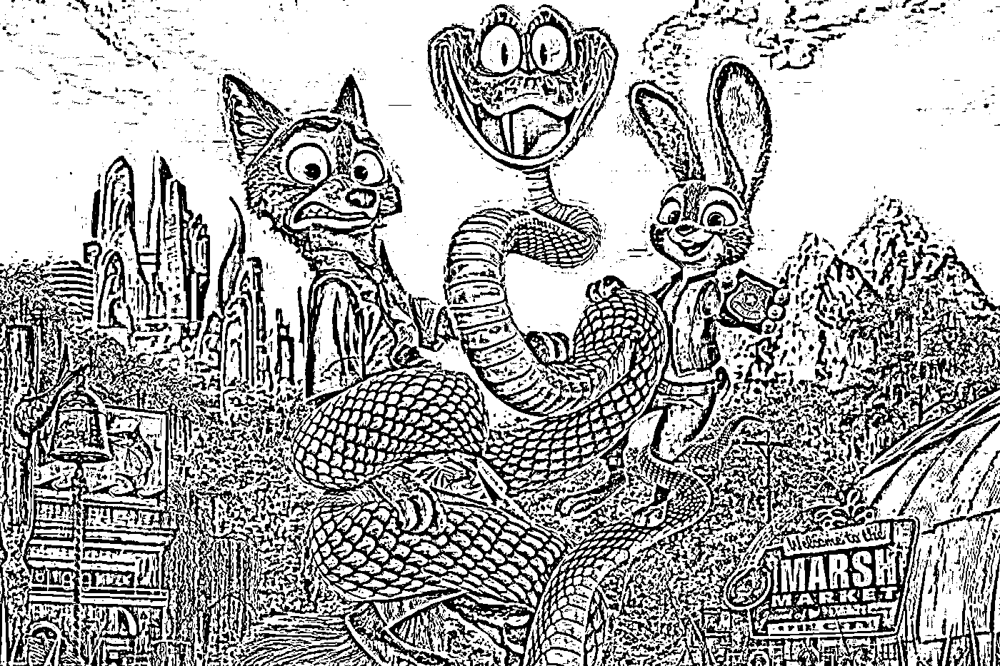

In [74]:
img_threshold = cv2.adaptiveThreshold(
    img_gray, # Use the grayscale image
    255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)

cv2_imshow(img_threshold)

#Edge Detection

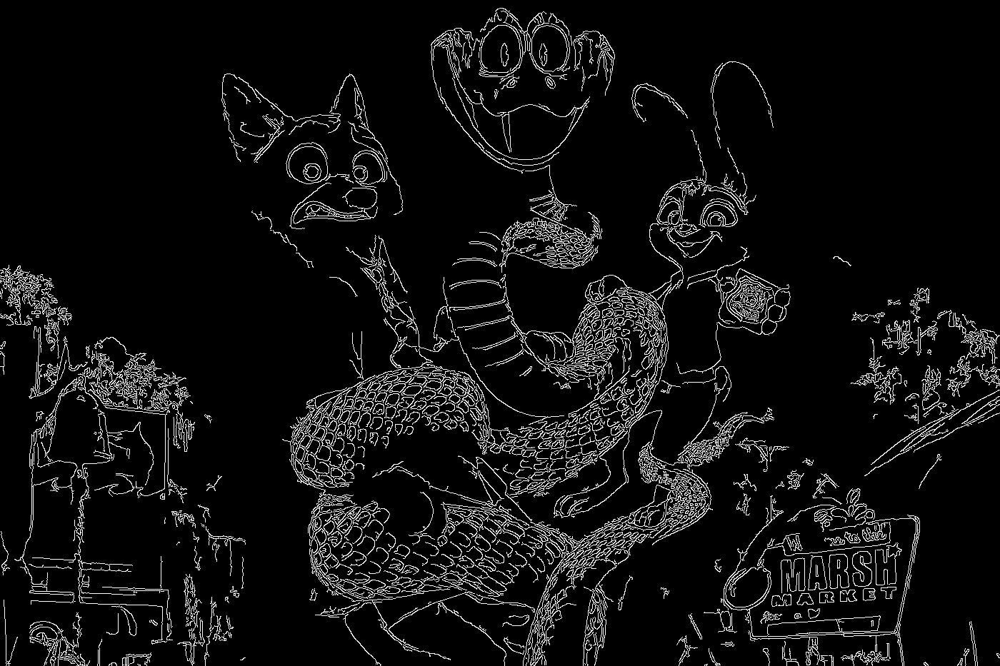

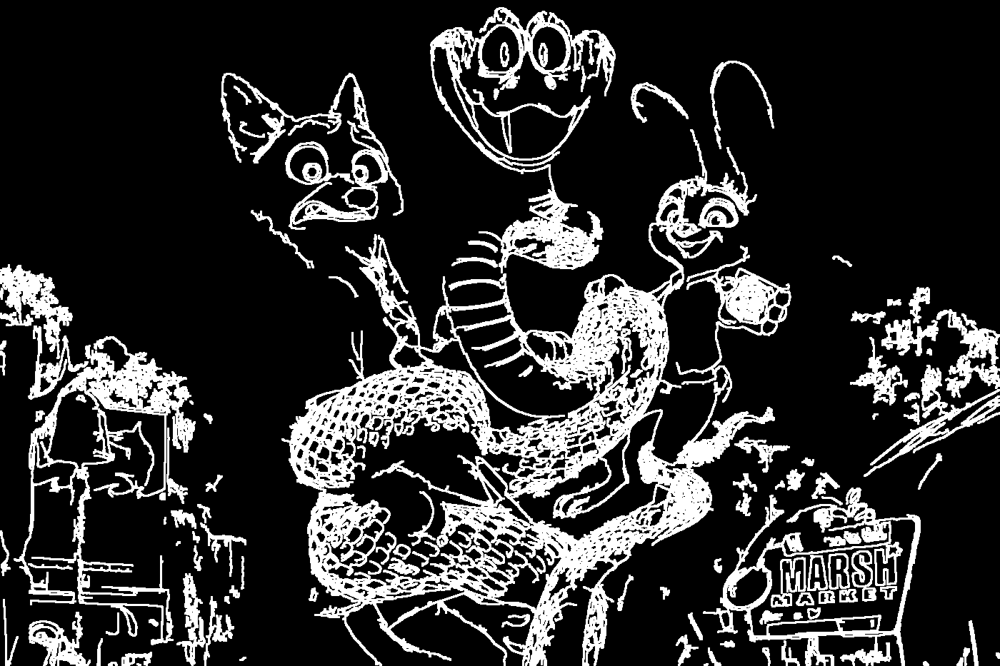

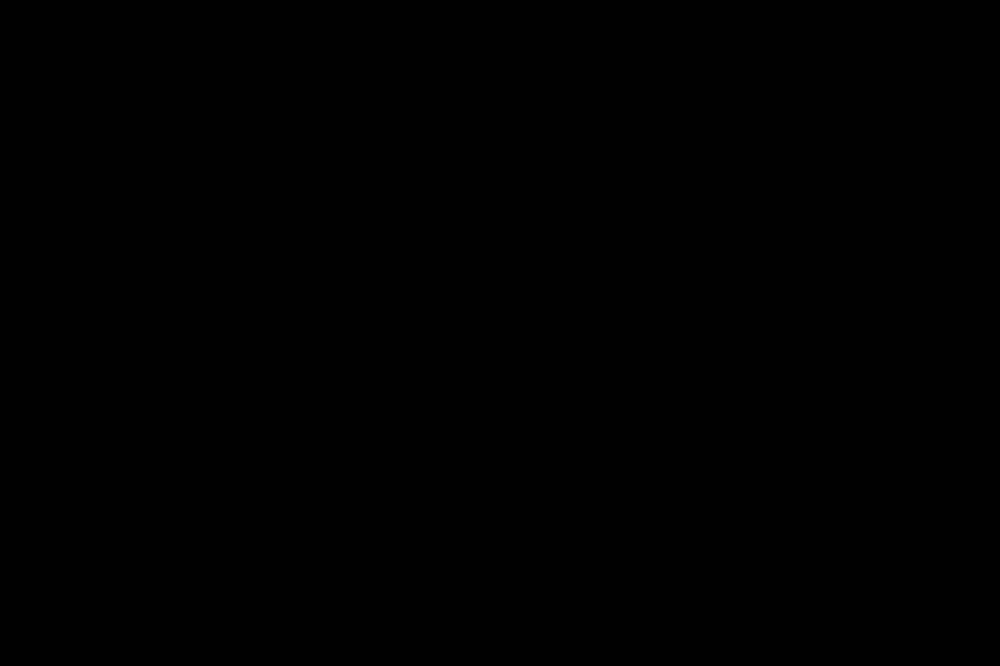

In [84]:
img_edge = cv2.Canny(img_np, 100, 300)

# Fix: np.ones expects shape as a tuple, and kernels are typically np.uint8
kernel = np.ones((3, 3), np.uint8)

img_edge_d = cv2.dilate(img_edge, kernel)
img_edge_e = cv2.erode(img_edge, kernel) # Assuming this was intended to be an erosion operation

cv2_imshow(img_edge)
cv2_imshow(img_edge_d) # Display the dilated image
cv2_imshow(img_edge_e) # Display the eroded image

#Draw on Whiteboard

Saving whiteboard.jpg to whiteboard (7).jpg
Successfully uploaded: whiteboard (7).jpg


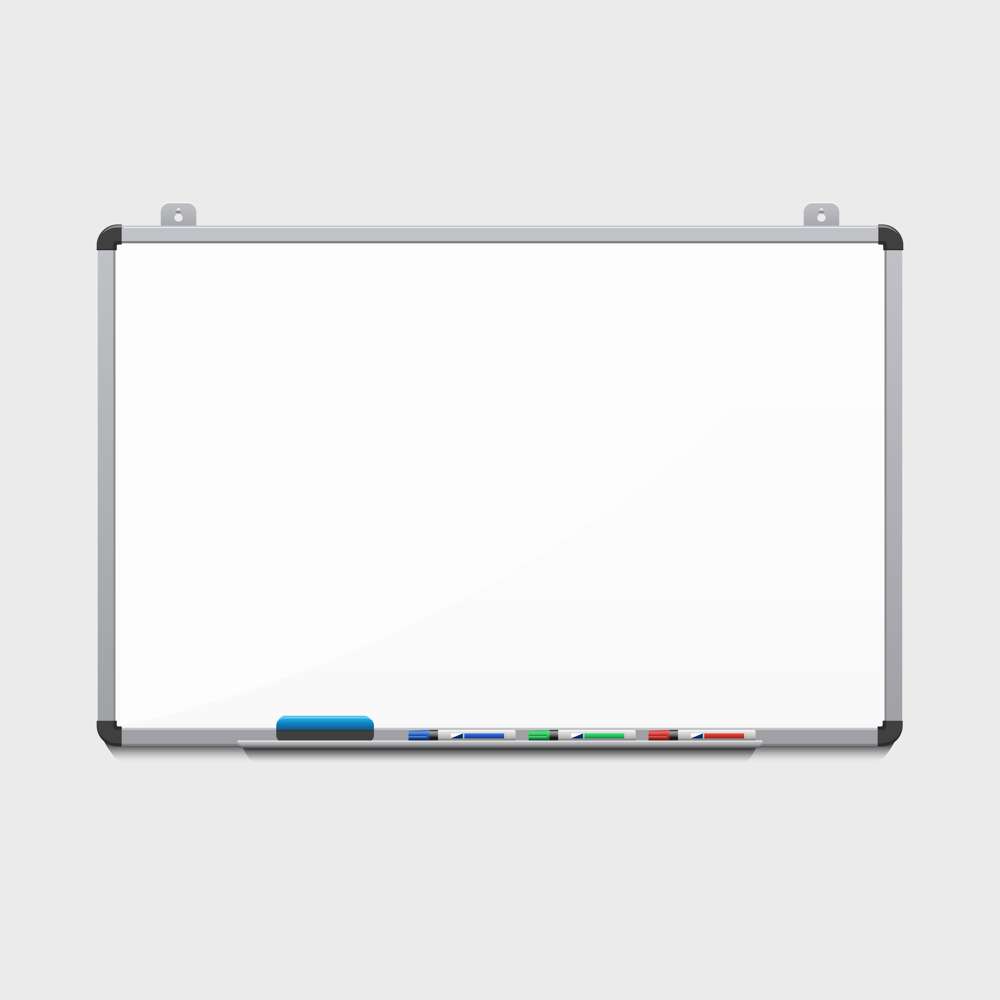

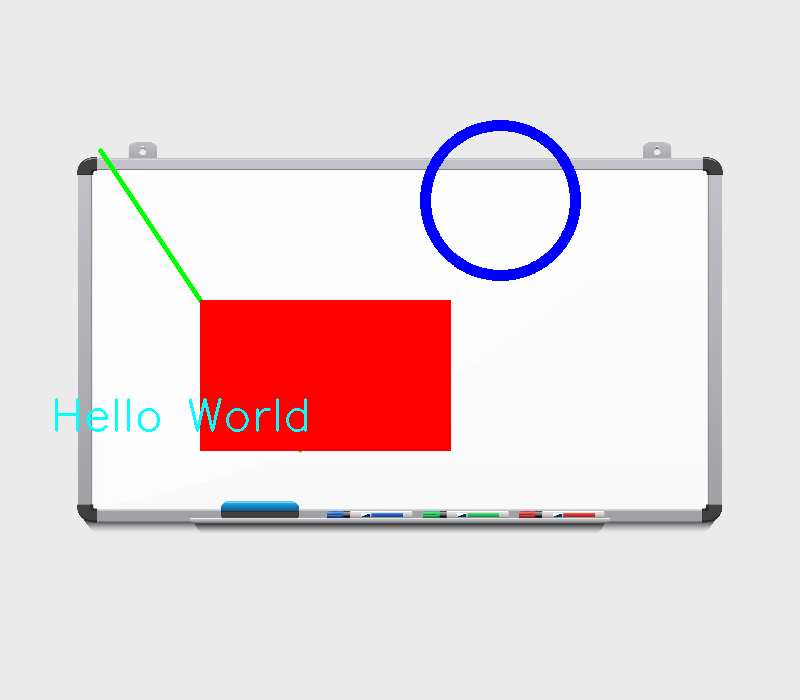

In [15]:
from google.colab import files
from PIL import Image
import io
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Assuming cv2_imshow is needed for display

# 1. Trigger the upload dialog
uploaded = files.upload()

# 2. Automatically find the file name (no more hardcoding 'zootopia2'!)
for filename in uploaded.keys():
    print(f'Successfully uploaded: {filename}')

    # 3. Read the image data directly from memory
    # io.BytesIO allows us to read the data without saving it to a folder first
    image_data = uploaded[filename]
    img_pil = Image.open(io.BytesIO(image_data))

    # 4. Display the original image (PIL object)
    display(img_pil)

    # Convert the PIL Image object to a NumPy array
    img_np = np.array(img_pil)

    # OpenCV functions expect BGR format, while PIL loads RGB. Convert it.
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    # Resize
    img_bgr = cv2.resize(img_bgr, (800, 700))

    # Line
    cv2.line(img_bgr, (100, 150), (300, 450), (0, 255, 0), 3)

    # Rectangle
    cv2.rectangle(img_bgr, (200, 300), (450, 450), (0, 0, 255), -1)

    # Circle
    cv2.circle(img_bgr, (500, 200), 75, (255, 0, 0), 10)

    # Text
    cv2.putText(img_bgr, 'Hello World', (50, 430),
                cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 0), 2)

    # Display the modified image
    cv2_imshow(img_bgr)

#Contours 轮廓

Saving spongebob jellyfish.jpeg to spongebob jellyfish (1).jpeg
Successfully uploaded: spongebob jellyfish (1).jpeg


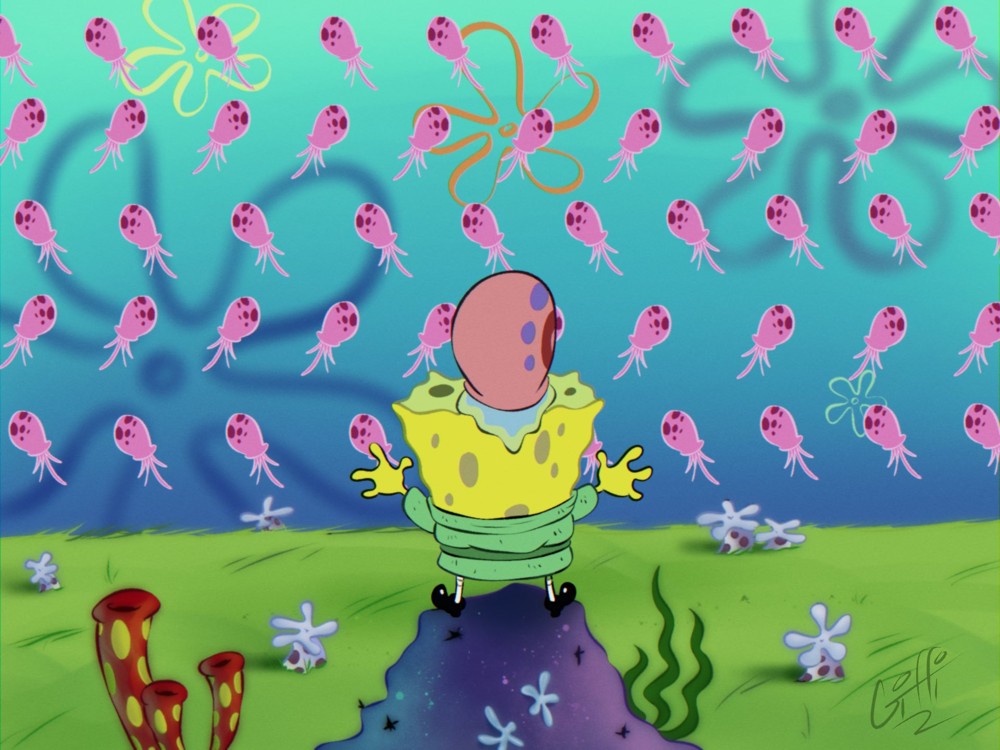

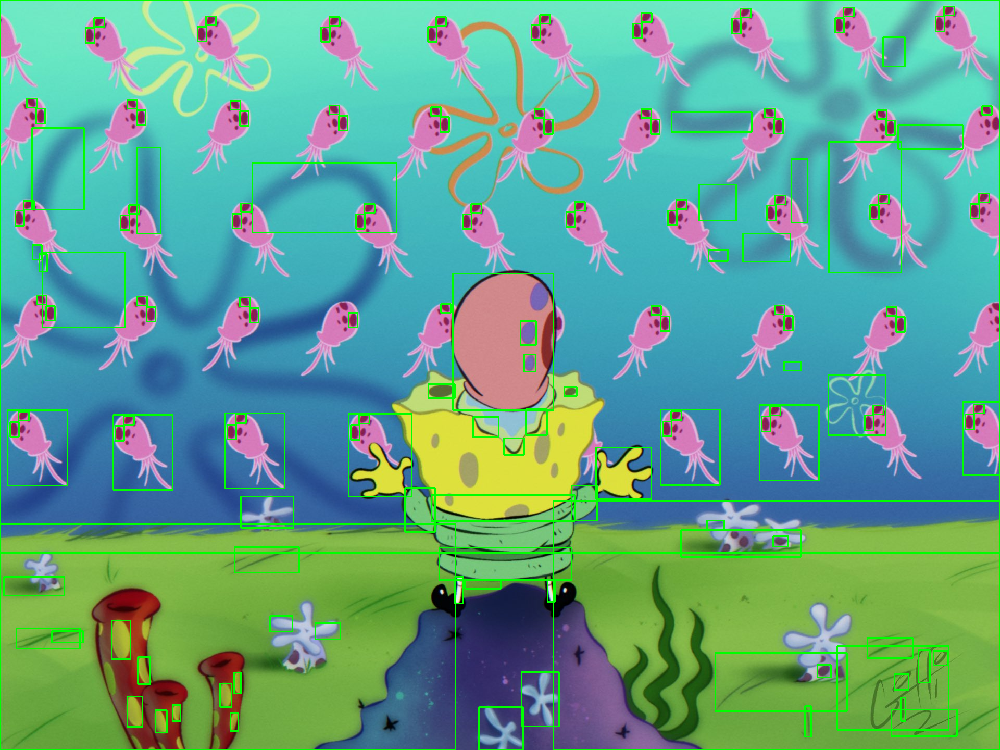

In [20]:
from google.colab import files
from PIL import Image
import io
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Assuming cv2_imshow is needed for display

# 1. Trigger the upload dialog
uploaded = files.upload()

# 2. Automatically find the file name (no more hardcoding 'zootopia2'!)
for filename in uploaded.keys():
    print(f'Successfully uploaded: {filename}')

    # 3. Read the image data directly from memory
    # io.BytesIO allows us to read the data without saving it to a folder first
    image_data = uploaded[filename]
    img_pil = Image.open(io.BytesIO(image_data))

    # 4. Display the original image (PIL object)
    display(img_pil)

    # Convert the PIL Image object to a NumPy array
    img_np = np.array(img_pil)

    # OpenCV functions expect BGR format, while PIL loads RGB. Convert it.
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    # Convert to grayscale for contour finding
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # Apply a threshold to get a binary image (essential for findContours)
    ret, thresh = cv2.threshold(img_gray, 127, 255, 0)

    # Find contours
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through contours and draw bounding rectangles if area is sufficient
    for cnt in contours:
        if cv2.contourArea(cnt) > 200: # Indent this line correctly
            x1, y1, w, h = cv2.boundingRect(cnt)
            cv2.rectangle(img_bgr, (x1, y1), (x1 + w, y1 + h), (0, 255, 0), 2)

    # Display the modified image
    cv2_imshow(img_bgr)